In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
#from vpolo.alevin import parser # to parse alevin output
from matplotlib import pyplot as plt, cm as mpl_cm
import seaborn as sns
from cycler import cycler
import statsmodels.api as sm
import statsmodels.stats.multitest as multi
from scipy.stats import pearsonr

seed = 0
np.random.seed(seed)

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_header()

version = '230812_pancancer_CD4T_NMFproj'
results_file = './scanpy/{}/res.h5ad'.format(version)

import os
os.makedirs('./scanpy/{}'.format(version), exist_ok=True)

sc.settings.figdir = './scanpy/{}/graph'.format(version)
sc.settings.cachedir = './scanpy/{}/cache'.format(version)
# %config InlineBackend.figure_format = 'retina'

import os
os.makedirs('./scanpy/{}'.format(version), exist_ok=True)
os.makedirs(sc.settings.figdir, exist_ok=True)

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-08-13 14:13:15.239829: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-13 14:13:15.473304: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-08-13 14:13:16.378534: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cann

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.3.0 statsmodels==0.13.5 python-igraph==0.10.2 pynndescent==0.5.8


In [3]:
from NMFproj import *

In [4]:
adata = sc.read('../GSE156728_pancancer_T_scRNAseq/scanpy/220728_EDA_CD4_yy/res.h5ad')

In [5]:
X = adata.raw.to_adata().to_df().T

In [6]:
X

index,AAACGGGGTGGGTATG.33,AAACGGGGTGTAATGA.33,AAAGATGCAATGAAAC.33,AACCGCGGTGGTCCGT.33,AACCGCGTCCGCGGTA.33,AACGTTGGTACGCTGC.33,AACGTTGTCCAGAAGG.33,AACTTTCGTTTGCATG.33,AAGGAGCAGGTGGGTT.33,AAGGAGCTCTGTCAAG.33,...,TTATGCTTCAATCACG.88,TTGCGTCAGCCTCGTG.88,TTGCGTCTCTTTAGTC.88,TTGGCAACACTTCGAA.88,TTTACTGCAACGCACC.88,TTTCCTCAGTGTACCT.88,TTTGCGCCAGCTGCAC.88,TTTGCGCGTATAATGG.88,TTTGCGCTCAACGGCC.88,TTTGTCAAGTAGGCCA.88
LINC00115,0.0,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
SAMD11,0.0,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
NOC2L,0.0,0.000000,1.129826,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,1.243525,0.992755,0.000000,0.000000,1.094893,0.0,0.000000
KLHL17,0.0,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
PLEKHN1,0.0,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C21orf58,0.0,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
PCNT,0.0,0.000000,1.129826,1.1124,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.344513,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
DIP2A,0.0,0.000000,1.129826,0.0000,0.0,0.0,0.0,0.000000,1.255987,0.0,...,0.0,0.0,0.0,0.344513,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
S100B,0.0,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


In [7]:
X.to_csv('../GSE156728_pancancer_T_scRNAseq/scanpy/220728_EDA_CD4_yy/X.csv')

In [14]:
fixed_W = pd.read_csv('/home/yyasumizu/yyoshiaki-git/NMFprojection/data/NMF.W.CD4T.csv.gz', 
                      index_col=0)

In [15]:
X_norm, X_trunc, df_H, fixed_W_trunc = NMFproj(X, fixed_W, return_truncated=True, normalized=True)
df_ev = calc_EV(X_trunc, fixed_W_trunc, df_H)
df_stats = calc_hvg_overlap(X_norm, fixed_W_trunc, min_mean=0.0125, max_mean=3, min_disp=0.1,
                            n_top_genes=500)
print('\n## Stats of overlap of HVGs')
msg = 'Num. genes in fixed W: %s \n' % fixed_W.shape[0]
msg += 'Num. Retained genes (Prop.): %s (%s)\n' % (fixed_W_trunc.shape[0], fixed_W_trunc.shape[0]/fixed_W.shape[0])
msg += 'Prop. overlap of HVGs (POH) : {} in {} query HVGs'.format(
    df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum(), 
    df_stats.highly_variable.sum())
print(msg)

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/NMFproj/NMFproj.py:49: UserWarning: input X looks normalized though normalized flag was not passed
  warnings.warn("input X looks normalized though normalized flag was not passed")


extracting highly variable genes
    finished (0:00:23)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

## Stats of overlap of HVGs
Num. genes in fixed W: 1271 
Num. Retained genes (Prop.): 1068 (0.8402832415420929)
Prop. overlap of HVGs (POH) : 0.53 in 500 query HVGs


In [16]:
df_ev

,ExplainedVariance
NMF_0,0.015703
NMF_1,0.023093
NMF_2,0.007439
NMF_3,0.010465
NMF_4,0.003921
NMF_5,0.060688
NMF_6,0.028064
NMF_7,0.011299
NMF_8,0.128323
NMF_9,0.004450


In [9]:
adata

AnnData object with n_obs × n_vars = 74776 × 1121
    obs: 'n_genes', 'cancerType', 'patient', 'libraryID', 'loc', 'meta.cluster', 'platform', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 

In [5]:
arr_exp = adata.X
# if the matrix is sparse matrix, convert to dense matrix.
# arr_exp = adata.X.todense()
arr_exp = np.where(arr_exp > 0, arr_exp, 0)

In [6]:
from sklearn.decomposition import NMF

from NMFproj import *

In [43]:
%%time

list_evar = []
for n_comp in range(10,25):
    model = NMF(n_components=n_comp, init='random', random_state=seed)
    H = model.fit_transform(arr_exp)
    W = model.components_

    df_evar = calc_EV(arr_exp.T, pd.DataFrame(W).T, pd.DataFrame(H).T)
    evar = df_evar.loc['ALL', 'ExplainedVariance']
    corr = (np.array(pd.DataFrame(W).T.corr()) - np.eye(n_comp)).max()
    
    list_evar.append([n_comp, evar, corr])

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: Conve

CPU times: user 17min 40s, sys: 25.3 s, total: 18min 6s
Wall time: 18min 8s


In [44]:
df_evar = pd.DataFrame(list_evar, columns=['n_comp', 'Evar', 'corr'])
# df_evar.to_csv(str(sc.settings.figdir) + '/stats_components_NMF.csv')
df_evar

,n_comp,Evar,corr
0,10,0.185345,0.249921
1,11,0.189074,0.288830
2,12,0.192294,0.292978
3,13,0.194771,0.297587
4,14,0.197449,0.301140
5,15,0.199633,0.323677
6,16,0.201851,0.344318
7,17,0.204086,0.307913
8,18,0.206189,0.276401
9,19,0.207900,0.304606


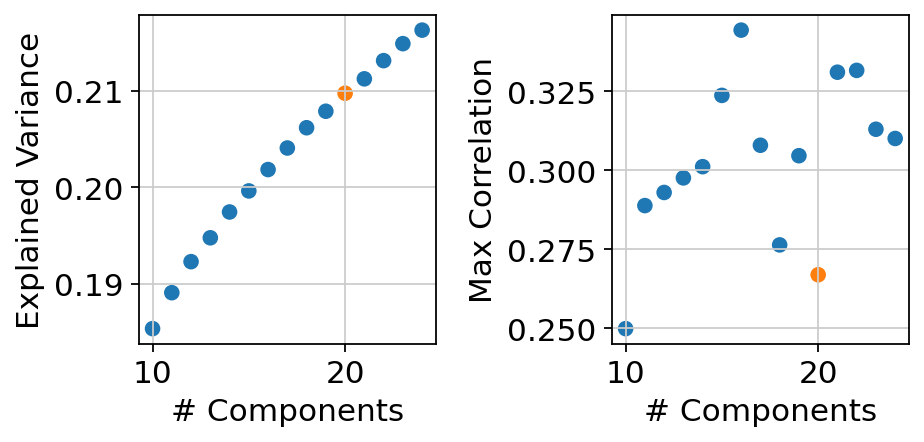

In [45]:
n_comp = 20

plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
# plt.scatter(df_evar['n_comp'], df_evar['Evar'])
plt.scatter(df_evar['n_comp'], df_evar['Evar'], c=['tab:blue' if n_c != n_comp else 'tab:orange' for n_c in df_evar.n_comp])

plt.ylabel('Explained Variance')
plt.xlabel('# Components')

plt.subplot(1,2,2)
# plt.scatter(df_evar['n_comp'], df_evar['corr'])
plt.scatter(df_evar['n_comp'], df_evar['corr'], c=['tab:blue' if n_c != n_comp else 'tab:orange' for n_c in df_evar.n_comp])
plt.ylabel('Max Correlation')
plt.tight_layout()
plt.xlabel('# Components')
plt.savefig(str(sc.settings.figdir) + '/NMF_qc.pdf', bbox_inches='tight')

In [15]:
model = NMF(n_components=n_comp, init='random', random_state=seed)
H = model.fit_transform(arr_exp)
W = model.components_

df_evar = calc_EV(arr_exp.T, pd.DataFrame(W).T, pd.DataFrame(H).T)
    
for c in range(n_comp):
    adata.obs['NMF_{}'.format(c)] = H[:,[c]]
    adata.var['NMF_{}'.format(c)] = W[c,:]
adata.var[['NMF_{}'.format(c) for c in range(n_comp)]].to_csv('../GSE156728_pancancer_T_scRNAseq/scanpy/220728_EDA_CD4_yy/NMF.W.pancancer.CD4T.csv')

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


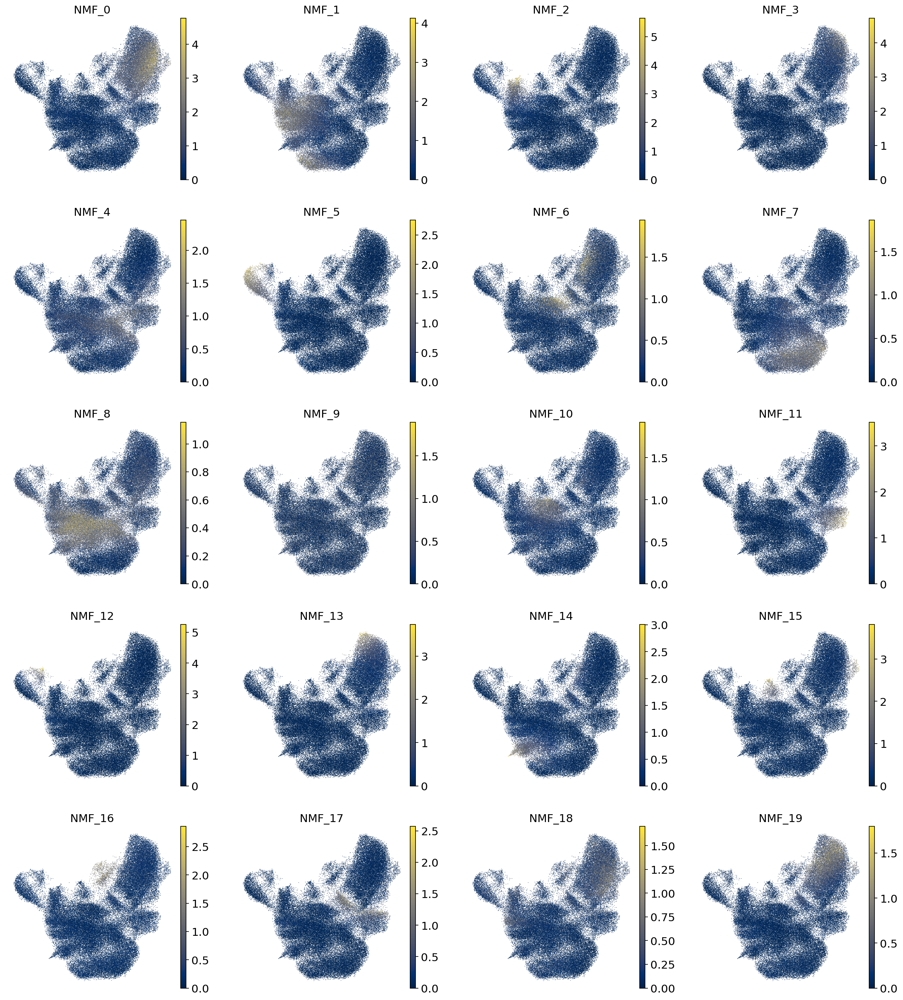

In [42]:
sc.pl.umap(adata, color=['NMF_{}'.format(c) for c in range(n_comp)], cmap='cividis', save='NMF_pancancer')

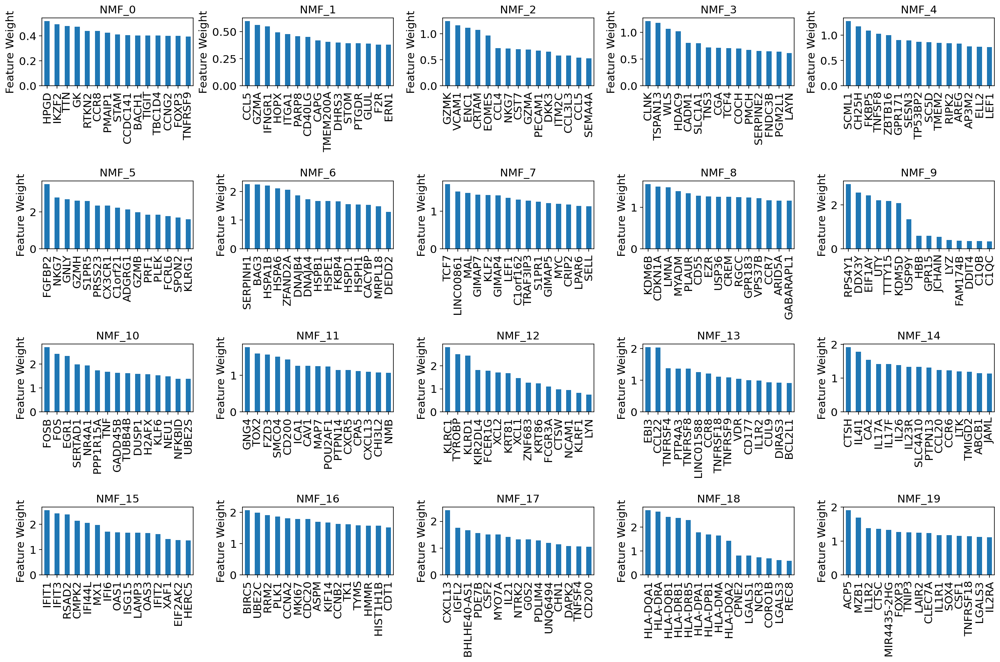

In [41]:
# Feature Weight
plt.figure(figsize=(18,12))
for i,c in enumerate(range(n_comp)):
    plt.subplot(4,5,i+1)
    adata.var['NMF_{}'.format(c)].sort_values(ascending=False).head(15).plot.bar()
    plt.grid(False)
    plt.title('NMF_{}'.format(c))
    plt.ylabel('Feature Weight')
plt.tight_layout()
plt.savefig(str(sc.settings.figdir) + '/bar_NMF_featureweight.pdf', bbox_inches='tight')

In [32]:
df_W_pancancer = pd.DataFrame(W, columns=adata.var.index, index=[f'NMF_{i}' for i in range(W.shape[0])]).T
df_W_pancancer.columns = 'pancancerCD4T:' + df_W_pancancer.columns
df_W_pancancer

,pancancerCD4T:NMF_0,pancancerCD4T:NMF_1,pancancerCD4T:NMF_2,pancancerCD4T:NMF_3,pancancerCD4T:NMF_4,pancancerCD4T:NMF_5,pancancerCD4T:NMF_6,pancancerCD4T:NMF_7,pancancerCD4T:NMF_8,pancancerCD4T:NMF_9,pancancerCD4T:NMF_10,pancancerCD4T:NMF_11,pancancerCD4T:NMF_12,pancancerCD4T:NMF_13,pancancerCD4T:NMF_14,pancancerCD4T:NMF_15,pancancerCD4T:NMF_16,pancancerCD4T:NMF_17,pancancerCD4T:NMF_18,pancancerCD4T:NMF_19
ISG15,0.049425,0.011851,0.044409,0.000000,0.000000,0.071399,0.178658,0.012448,0.333334,0.031608,0.067967,0.026529,0.000000,0.062110,0.072030,1.670296,0.012187,0.086104,0.227695,0.506120
TNFRSF18,0.101944,0.000000,0.000000,0.328160,0.000000,0.000000,0.000000,0.000000,0.046049,0.000000,0.000000,0.028158,0.063414,1.115482,0.063822,0.000000,0.000000,0.564605,0.115671,1.139570
TNFRSF4,0.087908,0.000000,0.000000,0.140990,0.000000,0.000000,0.007742,0.089084,0.265355,0.000000,0.000000,0.108448,0.000000,1.374994,0.000000,0.000000,0.000000,0.328385,0.198331,0.748254
MEGF6,0.067307,0.079316,0.000000,0.023615,0.084715,0.000000,0.000000,0.217086,0.022822,0.000000,0.200611,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TNFRSF9,0.393502,0.000000,0.135701,0.282094,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.013045,1.093792,0.000000,0.000000,0.000000,0.000000,0.000000,0.362628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MX2,0.044002,0.000000,0.033073,0.000000,0.273773,0.000000,0.000000,0.418643,0.470214,0.013010,0.000000,0.000000,0.000000,0.000000,0.000000,1.311495,0.000000,0.000000,0.000000,0.000000
MX1,0.088630,0.000000,0.036374,0.017361,0.083685,0.000000,0.000000,0.115199,0.222647,0.000000,0.000000,0.000000,0.000000,0.075978,0.000000,1.975161,0.040809,0.135593,0.086125,0.256992
ITGB2-AS1,0.000000,0.105334,0.055719,0.000000,0.029429,0.176487,0.000000,0.605770,0.000000,0.031198,0.093931,0.347458,0.000000,0.000000,0.000000,0.000000,0.000000,0.094095,0.262388,0.288871
COL6A2,0.000000,0.000000,0.000000,0.000000,0.075426,0.777613,0.000000,0.223860,0.044004,0.000000,0.037204,0.000575,0.115688,0.000000,0.000000,0.000000,0.000000,0.019129,0.000000,0.000000


In [27]:
df_W_cCD4T = pd.read_csv('/home/yyasumizu/yyoshiaki-git/NMFprojection/data/NMF.W.CD4T.csv.gz', index_col=0)
df_W_cCD4T.columns = 'cCD4T:' + df_W_cCD4T.columns
df_W_cCD4T.head()

,NMF_0,NMF_1,NMF_2,NMF_3,NMF_4,NMF_5,NMF_6,NMF_7,NMF_8,NMF_9,NMF_10,NMF_11
LINC00115,0.028065,0.022414,0.022533,0.140076,0.046632,0.000000,0.077666,0.000000,0.078949,0.032568,0.089939,0.021428
HES4,0.000000,0.002400,0.000000,0.062325,0.175762,0.000000,0.000000,0.409772,0.000000,0.080368,0.000000,0.000000
ISG15,0.078505,0.016911,0.070525,0.053799,0.166165,0.208394,0.147570,1.616325,0.118240,0.057102,0.223594,0.074722
TNFRSF18,0.000061,0.094786,0.732933,0.000000,0.000000,0.342539,0.000000,0.000000,0.317724,0.000000,0.000000,0.000000
TNFRSF4,0.000000,0.133513,0.550942,0.000000,0.000000,0.181082,0.239739,0.034151,0.946191,0.000000,0.000000,0.000000


In [34]:
df_W_merge = pd.merge(df_W_pancancer, df_W_cCD4T, left_index=True, right_index=True, how='inner')
df_W_merge

,pancancerCD4T:NMF_0,pancancerCD4T:NMF_1,pancancerCD4T:NMF_2,pancancerCD4T:NMF_3,pancancerCD4T:NMF_4,pancancerCD4T:NMF_5,pancancerCD4T:NMF_6,pancancerCD4T:NMF_7,pancancerCD4T:NMF_8,pancancerCD4T:NMF_9,...,cCD4T:NMF_2,cCD4T:NMF_3,cCD4T:NMF_4,cCD4T:NMF_5,cCD4T:NMF_6,cCD4T:NMF_7,cCD4T:NMF_8,cCD4T:NMF_9,cCD4T:NMF_10,cCD4T:NMF_11
ISG15,0.049425,0.011851,0.044409,0.000000,0.000000,0.071399,0.178658,0.012448,0.333334,0.031608,...,0.070525,0.053799,0.166165,0.208394,0.147570,1.616325,0.118240,0.057102,0.223594,0.074722
TNFRSF18,0.101944,0.000000,0.000000,0.328160,0.000000,0.000000,0.000000,0.000000,0.046049,0.000000,...,0.732933,0.000000,0.000000,0.342539,0.000000,0.000000,0.317724,0.000000,0.000000,0.000000
TNFRSF4,0.087908,0.000000,0.000000,0.140990,0.000000,0.000000,0.007742,0.089084,0.265355,0.000000,...,0.550942,0.000000,0.000000,0.181082,0.239739,0.034151,0.946191,0.000000,0.000000,0.000000
TNFRSF1B,0.225229,0.083160,0.159005,0.204806,0.051517,0.270095,0.000000,0.000000,0.501984,0.031943,...,0.302185,0.131838,0.037891,0.405389,0.484868,0.000000,0.190482,0.000000,0.081721,0.196730
ID3,0.089998,0.000000,0.000000,0.143172,0.000000,0.000000,0.421331,0.273583,0.104654,0.000000,...,0.000000,0.688532,0.000000,0.046291,0.212878,0.000000,0.448003,0.187716,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MX2,0.044002,0.000000,0.033073,0.000000,0.273773,0.000000,0.000000,0.418643,0.470214,0.013010,...,0.029835,0.499484,0.118674,0.000000,0.199859,0.959863,0.217634,0.070817,0.000000,0.047672
MX1,0.088630,0.000000,0.036374,0.017361,0.083685,0.000000,0.000000,0.115199,0.222647,0.000000,...,0.008123,0.149610,0.212628,0.059380,0.125503,1.706907,0.033080,0.062509,0.160515,0.016804
ITGB2-AS1,0.000000,0.105334,0.055719,0.000000,0.029429,0.176487,0.000000,0.605770,0.000000,0.031198,...,0.000000,0.621997,0.031504,0.055579,0.324022,0.057310,0.376691,0.345313,0.192407,0.125130
COL6A2,0.000000,0.000000,0.000000,0.000000,0.075426,0.777613,0.000000,0.223860,0.044004,0.000000,...,0.098023,0.413566,0.026821,0.000000,0.000000,0.000000,0.022330,0.026559,0.000000,0.208141


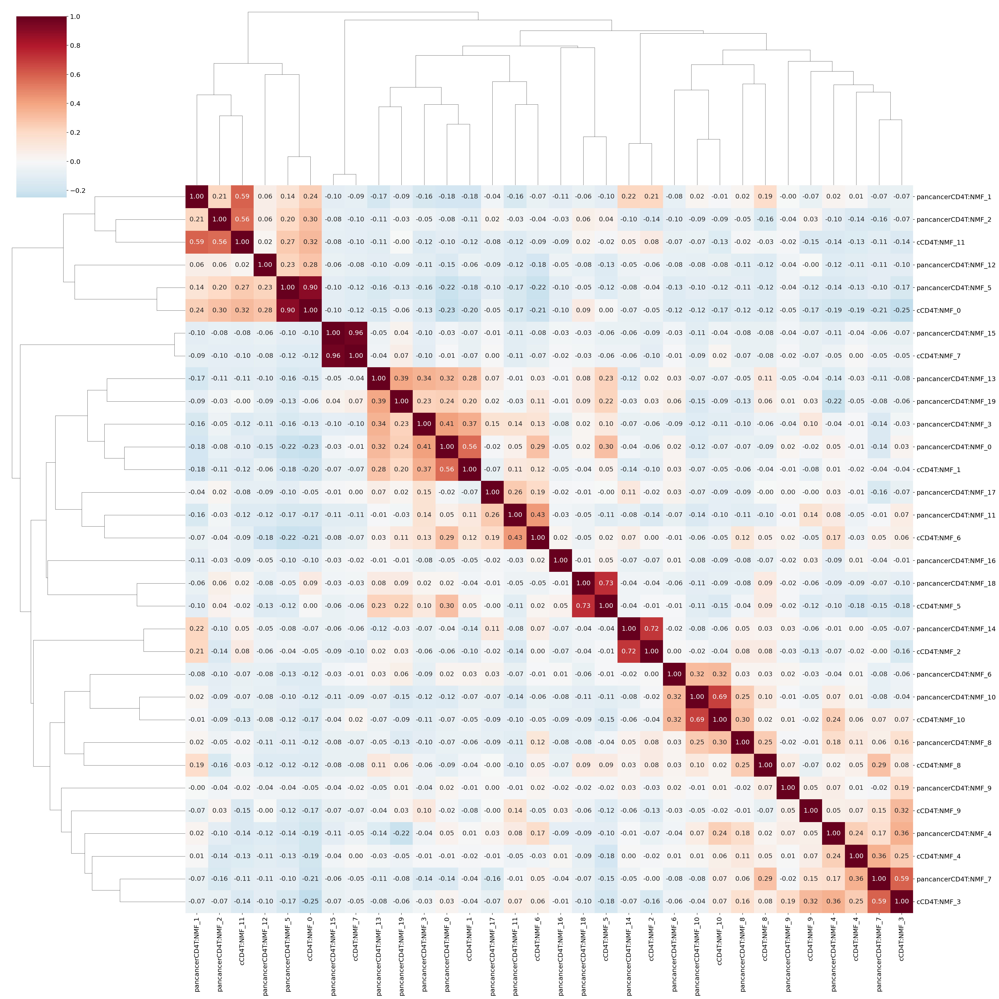

In [46]:
sns.clustermap(df_W_merge.corr(), cmap='RdBu_r', center=0, annot=True, fmt='.2f', figsize=(30, 30))
plt.savefig(str(sc.settings.figdir) + '/corr_NMF_featureweight.pdf', bbox_inches='tight')